In [ ]:
!pip install tensorflow tensorflow-gpu


Found existing installation: tensorflow 2.18.0
Uninstalling tensorflow-2.18.0:
  Would remove:
    /usr/local/bin/import_pb_to_tensorboard
    /usr/local/bin/saved_model_cli
    /usr/local/bin/tensorboard
    /usr/local/bin/tf_upgrade_v2
    /usr/local/bin/tflite_convert
    /usr/local/bin/toco
    /usr/local/bin/toco_from_protos
    /usr/local/lib/python3.11/dist-packages/tensorflow-2.18.0.dist-info/*
    /usr/local/lib/python3.11/dist-packages/tensorflow/*
Proceed (Y/n)? Y
  Successfully uninstalled tensorflow-2.18.0


In [1]:
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.utils import Sequence
import matplotlib.pyplot as plt
import numpy as np
import os
import cv2
from sklearn.model_selection import train_test_split
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam


---
Models
---

---
U-Net Model variations
*   U_NET with input and output image size to be 128 or 256
*   U_NET with different dropout_rate
---

In [2]:
def residual_block(x, filters, dropout_rate=0.0):
    shortcut = x
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)

    # Match the number of filters in the shortcut to the output
    if shortcut.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, 1, padding='same')(shortcut)

    x = layers.add([shortcut, x])
    x = layers.ReLU()(x)
    return x


def downsample_block(x, filters, dropout_rate=0.0):
    f = residual_block(x, filters, dropout_rate)
    p = layers.MaxPooling2D(2)(f)
    return f, p

def upsample_block(x, skip, filters, dropout_rate=0.0):
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
    x = layers.concatenate([x, skip])
    x = residual_block(x, filters, dropout_rate)
    return x

def UnetImproved(input_shape=(128, 128, 3), dropout_rate=0.0):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    f1, p1 = downsample_block(inputs, 64, dropout_rate)
    f2, p2 = downsample_block(p1, 128, dropout_rate)
    f3, p3 = downsample_block(p2, 256, dropout_rate)
    f4, p4 = downsample_block(p3, 512, dropout_rate)

    # Bottleneck
    bottleneck = residual_block(p4, 1024, dropout_rate)

    # Decoder
    u6 = upsample_block(bottleneck, f4, 512, dropout_rate)
    u7 = upsample_block(u6, f3, 256, dropout_rate)
    u8 = upsample_block(u7, f2, 128, dropout_rate)
    u9 = upsample_block(u8, f1, 64, dropout_rate)

    # Output
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(u9)

    model = tf.keras.Model(inputs, outputs, name="U-Net_Improved")
    return model

# Instantiate and summarize the model
model = UnetImproved(dropout_rate=0.1)
model.summary()


Model: "U-Net_Improved"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 128, 128, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 128, 128, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 128, 128, 64)   │            256 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu (ReLU)              │ (None, 128, 128, 64)   │              0 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 128, 128, 64)   │         36,928 │ re_lu[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 128, 128, 64)   │            256 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 64)   │            256 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 128, 128, 64)   │              0 │ conv2d_2[0][0],        │
│                           │                        │                │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_1 (ReLU)            │ (None, 128, 128, 64)   │              0 │ add[0][0]              │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 64, 64, 64)     │              0 │ re_lu_1[0][0]          │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_2     │ (None, 64, 64, 128)    │            512 │ conv2d_3[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_2 (ReLU)            │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 128)    │        147,584 │ re_lu_2[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_3     │ (None, 64, 64, 128)    │            512 │ conv2d_4[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)    

 Total params: 32,451,073 (123.79 MB)

 Trainable params: 32,439,297 (123.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
# with varied drop_out rate
def downsample_block(x, filters, dropout_rate=0.0):
    # Convolution block with batch normalization
    x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    # Optionally add dropout
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    # Save the feature map for skip connection, then apply max pooling
    f = x
    p = layers.MaxPooling2D(2)(x)
    return f, p

def upsample_block(x, skip, filters, dropout_rate=0.0):
    # Upsample the input
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
    # Concatenate with the corresponding skip connection
    x = layers.concatenate([x, skip])
    # Convolution block with batch normalization
    x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, 3, activation='relu', padding='same')(x)
    x = layers.BatchNormalization()(x)
    # Optionally add dropout
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)
    return x

def UnetImproved():
    inputs = layers.Input(shape=(256, 256, 3))

    # Encoder: Downsampling blocks
    f1, p1 = downsample_block(inputs, 64, dropout_rate=0.1)
    f2, p2 = downsample_block(p1, 128, dropout_rate=0.1)
    f3, p3 = downsample_block(p2, 256, dropout_rate=0.2)
    f4, p4 = downsample_block(p3, 512, dropout_rate=0.2)

    # Bottleneck
    bottleneck = layers.Conv2D(1024, 3, activation='relu', padding='same')(p4)
    bottleneck = layers.BatchNormalization()(bottleneck)
    bottleneck = layers.Conv2D(1024, 3, activation='relu', padding='same')(bottleneck)
    bottleneck = layers.BatchNormalization()(bottleneck)

    # Decoder: Upsampling blocks
    u6 = upsample_block(bottleneck, f4, 512, dropout_rate=0.2)
    u7 = upsample_block(u6, f3, 256, dropout_rate=0.2)
    u8 = upsample_block(u7, f2, 128, dropout_rate=0.1)
    u9 = upsample_block(u8, f1, 64, dropout_rate=0.1)

    # Output layer for binary segmentation (face mask vs. background)
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(u9)

    model = tf.keras.Model(inputs, outputs, name="U-Net_Improved")
    return model

# Instantiate and summarize the model
model = UnetImproved()
model.summary()


Model: "U-Net_Improved"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2             │ (None, 512, 512, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_38 (Conv2D)        │ (None, 512, 512, 64)   │          1,792 │ input_layer_2[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_36    │ (None, 512, 512, 64)   │            256 │ conv2d_38[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_39 (Conv2D)        │ (None, 512, 512, 64)   │         36,928 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_37    │ (None, 512, 512, 64)   │            256 │ conv2d_39[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_16 (Dropout)      │ (None, 512, 512, 64)   │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_8           │ (None, 256, 256, 64)   │              0 │ dropout_16[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_40 (Conv2D)        │ (None, 256, 256, 128)  │         73,856 │ max_pooling2d_8[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_38    │ (None, 256, 256, 128)  │            512 │ conv2d_40[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_41 (Conv2D)        │ (None, 256, 256, 128)  │        147,584 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_39    │ (None, 256, 256, 128)  │            512 │ conv2d_41[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_17 (Dropout)      │ (None, 256, 256, 128)  │              0 │ batch_normalization_3… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_9           │ (None, 128, 128, 128)  │              0 │ dropout_17[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_42 (Conv2D)        │ (None, 128, 128, 256)  │        295,168 │ max_pooling2d_9[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_40    │ (None, 128, 128, 256)  │          1,024 │ conv2d_42[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_43 (Conv2D)   

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
# basic U-net model with size 256*256
def double_conv_block(x, n):
  x = layers.Conv2D(n, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
  x = layers.Conv2D(n, 3, padding = "same", activation = "relu", kernel_initializer = "he_normal")(x)
  return x

def downsample_block(x, n):
  f = double_conv_block(x, n)
  p = layers.MaxPool2D((2, 2))(f)
  p = layers.Dropout(0.1)(p)
  return f, p

def upsample_block(x, conv_features, n):
  x = layers.Conv2DTranspose(n, (3, 2), strides = 2, padding = "same")(x)
  x = layers.concatenate([x, conv_features])
  x = double_conv_block(x, n)
  return x
def Unet():
  inputs = layers.Input(shape=(256,256,3))
  f1, p1 = downsample_block(inputs, 64)
  f2, p2 = downsample_block(p1, 128)
  f3, p3 = downsample_block(p2, 256)
  f4, p4 = downsample_block(p3, 512)
  bottleneck = double_conv_block(p4, 1024)
  u6 = upsample_block(bottleneck, f4, 512)
  u7 = upsample_block(u6, f3, 256)
  u8 = upsample_block(u7, f2, 128)
  u9 = upsample_block(u8, f1, 64)
  outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(u9)

  unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
  return unet_model

model = Unet()
model.summary()

Model: "U-Net"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 64)   │          1,792 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 64)   │         36,928 │ conv2d[0][0]           │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 128, 128, 64)   │              0 │ conv2d_1[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 128, 128, 64)   │              0 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 128, 128, 128)  │         73,856 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_3 (Conv2D)         │ (None, 128, 128, 128)  │        147,584 │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 64, 64, 128)    │              0 │ conv2d_3[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 64, 64, 128)    │              0 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_4 (Conv2D)         │ (None, 64, 64, 256)    │        295,168 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_5 (Conv2D)         │ (None, 64, 64, 256)    │        590,080 │ conv2d_4[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 32, 32, 256)    │              0 │ conv2d_5[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 32, 32, 256)    │              0 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_6 (Conv2D)         │ (None, 32, 32, 512)    │      1,180,160 │ dropout_2[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_7 (Conv2D)         │ (None, 32, 32, 512)    │      2,359,808 │ conv2d_6[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 16, 16, 512)    │              0 │ conv2d_7[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_3 (Dropout)       │ (None, 16, 16, 512)    │              0 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_8 (Conv2D)    

 Total params: 32,424,385 (123.69 MB)

 Trainable params: 32,424,385 (123.69 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# basic u-net model with image-size 128
def Unet():
  inputs = layers.Input(shape=(128,128,3))
  f1, p1 = downsample_block(inputs, 32)
  f2, p2 = downsample_block(p1, 64)
  f3, p3 = downsample_block(p2, 128)
  f4, p4 = downsample_block(p3, 256)
  f5, p5 = downsample_block(p4, 512)
  bottleneck = double_conv_block(p5, 1024)
  u6 = upsample_block(bottleneck, f5, 512)
  u7 = upsample_block(u6, f4, 256)
  u8 = upsample_block(u7, f3, 128)
  u9 = upsample_block(u8, f2, 64)
  u10 = upsample_block(u9, f1, 32)
  outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(u10)

  unet_model = tf.keras.Model(inputs, outputs, name="U-Net")
  return unet_model

model = Unet()
model.summary()

---
Dataset uploaded using kaggle with api
---

In [3]:
os.makedirs("/root/.kaggle", exist_ok=True)
!mv kaggle.json /root/.kaggle/
!chmod 600 /root/.kaggle/kaggle.json

In [4]:
# needs to change according to your kaggle database structure
!kaggle datasets download nikayz/face-segmentation

Dataset URL: https://www.kaggle.com/datasets/nikayz/face-segmentation
License(s): unknown


In [5]:
!unzip /content/face-segmentation.zip -d /content/dataset


Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/MSFD/1/img/006601.jpg  
  inflating: /content/dataset/MSFD/1/img/006602.jpg  
  inflating: /content/dataset/MSFD/1/img/006603.jpg  
  inflating: /content/dataset/MSFD/1/img/006604.jpg  
  inflating: /content/dataset/MSFD/1/img/006605.jpg  
  inflating: /content/dataset/MSFD/1/img/006606.jpg  
  inflating: /content/dataset/MSFD/1/img/006607.jpg  
  inflating: /content/dataset/MSFD/1/img/006608.jpg  
  inflating: /content/dataset/MSFD/1/img/006609.jpg  
  inflating: /content/dataset/MSFD/1/img/006610.jpg  
  inflating: /content/dataset/MSFD/1/img/006611.jpg  
  inflating: /content/dataset/MSFD/1/img/006612.jpg  
  inflating: /content/dataset/MSFD/1/img/006613.jpg  
  inflating: /content/dataset/MSFD/1/img/006614.jpg  
  inflating: /content/dataset/MSFD/1/img/006615.jpg  
  inflating: /content/dataset/MSFD/1/img/006616.jpg  
  inflating: /content/dataset/MSFD/1/img/006617.jpg  
  inflating: /content/dataset/M

---
Image preprocessing steps
---

In [3]:
# this was done to make sure database does have any improper paths. Since it was found that because of certain file, the output binary mask from some index were improper which led to improper training output

# Paths to folders
IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"

TOTAL_SAMPLES = 9383
all_image_files = sorted(os.listdir(IMAGE_FOLDER))
all_mask_files = sorted(os.listdir(MASK_FOLDER))
for i in range(len(all_image_files)):
    if(all_image_files[i] != all_mask_files[i]):
        print(i , " + ",all_image_files[i]," + ", all_mask_files[i])
        break
# Old and new file names
old_mask_name = all_mask_files[TOTAL_SAMPLES-1]
new_mask_name = all_image_files[788]

# Full file paths
old_mask_path = os.path.join(MASK_FOLDER, old_mask_name)
new_mask_path = os.path.join(MASK_FOLDER, new_mask_name)

# Rename the incorrect file
os.rename(old_mask_path, new_mask_path)
all_image_files = sorted(os.listdir(IMAGE_FOLDER))
all_mask_files = sorted(os.listdir(MASK_FOLDER))
for i in range(len(all_image_files)):
    if(all_image_files[i] != all_mask_files[i]):
        print(i , " + ",all_image_files[i]," + ", all_mask_files[i])



IndexError: list index out of range

---
Points to note :


*   Image size were varied like using 128 * 128 and 256 * 256 because of computational limits
*   Initially 500-4000 samples of images were taken to train the model and finally the model which perfected better was taken to train and test over the dataset
*   Data Generator was used to train model based on horizontal, vertical shifts, and other features of images




In [5]:
IMG_SIZE = 128
TOTAL_SAMPLES = 4000
# Paths to folders
IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"

# it's used to get data from folder in sorted order wrt to file names so that output and input matches
def load_and_filter_data(image_folder, mask_folder, total_samples, noise_threshold=112):
    all_image_files = sorted(os.listdir(image_folder))
    all_mask_files = sorted(os.listdir(mask_folder))

    selected_images, selected_masks = [], []

    for img_name, mask_name in zip(all_image_files, all_mask_files):
        img_path = os.path.join(image_folder, img_name)
        mask_path = os.path.join(mask_folder, mask_name)

        img = cv2.imread(img_path)

        selected_images.append(img_name)
        selected_masks.append(mask_name)

        if len(selected_images) >= total_samples:
            break

    return selected_images, selected_masks

# Load and filter images
selected_image_files, selected_mask_files = load_and_filter_data(
    IMAGE_FOLDER, MASK_FOLDER, TOTAL_SAMPLES
)

# Function to load selected data and convert it into required format used in U_NET
def load_selected_data(image_files, mask_files, image_folder, mask_folder):
    images, masks = [], []

    for img_name, mask_name in zip(image_files, mask_files):
        img = cv2.imread(os.path.join(image_folder, img_name))
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0

        mask = cv2.imread(os.path.join(mask_folder, mask_name), cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        # dimension was added since input is of 128*128*3 but output has only 128*128*2
        mask = np.expand_dims(mask, axis=-1) / 255.0

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load only selected images as X(faces) and Y (binary-mask)
X, Y = load_selected_data(selected_image_files, selected_mask_files, IMAGE_FOLDER, MASK_FOLDER)

In [5]:
print(Y[0])
print(X[0])

[[[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 ...

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]

 [[0.]
  [0.]
  [0.]
  ...
  [0.]
  [0.]
  [0.]]]
[[[0.10980392 0.11372549 0.12941176]
  [0.11764706 0.12156863 0.1372549 ]
  [0.11372549 0.11764706 0.12941176]
  ...
  [0.22745098 0.24705882 0.25882353]
  [0.2        0.21960784 0.23137255]
  [0.20784314 0.21960784 0.23529412]]

 [[0.11372549 0.11764706 0.13333333]
  [0.10980392 0.11372549 0.12941176]
  [0.10980392 0.11372549 0.12941176]
  ...
  [0.25882353 0.27843137 0.29019608]
  [0.21568627 0.23529412 0.24705882]
  [0.21176471 0.22352941 0.23921569]]

 [[0.10980392 0.11372549 0.12941176]
  [0.10588235 0.10980392 0.1254902 ]
  [0.10588235 0.10980392 0.1254902 ]
  ...
  [0.22352941 0.24313725 0.25490196]
  [0.22352941 0.24313725 0.25490196]
  [0.21960784 0.23137255 0.24705882]]

 ...

In [ ]:
# To select random images from the dataset

IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"



IMG_SIZE = 256
TOTAL_SAMPLES = 500

random.seed(67)
all_image_files = sorted(os.listdir(IMAGE_FOLDER))
all_mask_files = sorted(os.listdir(MASK_FOLDER))

selected_indices = random.sample(range(len(all_image_files)), min(TOTAL_SAMPLES, len(all_image_files)))
selected_image_files = [all_image_files[i] for i in selected_indices]
selected_mask_files = [all_mask_files[i] for i in selected_indices]

# Function to load only the selected images
def load_selected_data(image_files, mask_files, image_folder, mask_folder):
    images, masks = [], []

    for img_name, mask_name in zip(image_files, mask_files):
        img = cv2.imread(os.path.join(image_folder, img_name))
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0

        mask = cv2.imread(os.path.join(mask_folder, mask_name), cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        # dimension was added since input is of 128*128*3 but output has only 128*128*2
        mask = np.expand_dims(mask, axis=-1) / 255.0

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

X, Y = load_selected_data(selected_image_files, selected_mask_files, IMAGE_FOLDER, MASK_FOLDER)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42)


In [6]:
# In this it was used to train wrt to data_augment

IMG_SIZE = 128
TOTAL_SAMPLES = 4000
def data_augment(X_train, Y_train):
    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True
    )
    return datagen.flow(X_train, Y_train, batch_size=16)

# Train-test split
X_train, X_test, Y_train, Y_test, train_img_names, test_img_names = train_test_split(
    X, Y, selected_image_files, test_size=0.2, random_state=42
)
train_generator = data_augment(X_train, Y_train)

In [ ]:
X_train.shape

(3200, 128, 128, 3)

---
Evaluation-metrics
---

In [10]:
# evaluation metric used

def iou_metric(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + tf.keras.backend.epsilon())


def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + tf.keras.backend.epsilon())


In [ ]:
# evaluation metric used

def iou_metric(y_true, y_pred):
    y_true = tf.cast(y_true > 0.5, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return intersection / (union + tf.keras.backend.epsilon())


def dice_coef(y_true, y_pred):
    y_true = tf.cast(y_true > 0.5, tf.float32)
    y_pred = tf.cast(y_pred > 0.5, tf.float32)
    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + tf.keras.backend.epsilon())


---
Training-models with hyperparameters
---

In [ ]:
# for image size: 256 and no of samples 800 (by taking more images, gpu was crashing)
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=30, batch_size=BATCH_SIZE)

Epoch 1/30
25/25 ━━━━━━━━━━━━━━━━━━━━ 260s 5s/step - accuracy: 0.5364 - dice_coef: 0.1335 - iou_metric: 0.0815 - loss: 1.3074 - val_accuracy: 0.6232 - val_dice_coef: 4.6985e-05 - val_iou_metric: 2.3494e-05 - val_loss: 0.6116
Epoch 2/30
25/25 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.5959 - dice_coef: 0.0717 - iou_metric: 0.0447 - loss: 0.6152 - val_accuracy: 0.3151 - val_dice_coef: 0.5080 - val_iou_metric: 0.3417 - val_loss: 0.6817
Epoch 3/30
25/25 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.4976 - dice_coef: 0.4601 - iou_metric: 0.3070 - loss: 0.6122 - val_accuracy: 0.5956 - val_dice_coef: 0.5499 - val_iou_metric: 0.3804 - val_loss: 0.4772
Epoch 4/30
25/25 ━━━━━━━━━━━━━━━━━━━━ 44s 2s/step - accuracy: 0.5309 - dice_coef: 0.6065 - iou_metric: 0.4787 - loss: 0.4855 - val_accuracy: 0.6232 - val_dice_coef: 0.0000e+00 - val_iou_metric: 0.0000e+00 - val_loss: 0.6049
Epoch 5/30
25/25 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.6121 - dice_coef: 0.0025 - iou_metric: 0.0013 - loss: 0

This section shows how data is not consistent as the mask for the person does not matches as the model trained above

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step


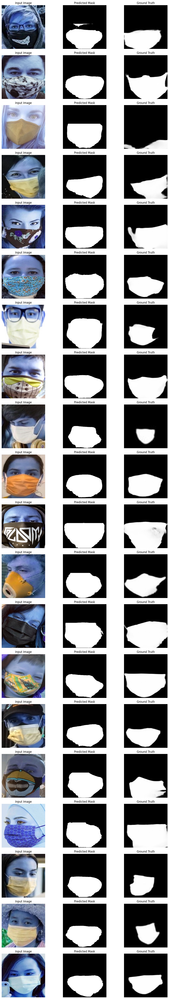

In [ ]:
# 20 random samples were taken to plot the output of the binary mask of the face
num_samples = 20

sample_indices = np.random.choice(len(X_test), size=num_samples, replace=False)

fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 3))

for i, idx in enumerate(sample_indices):
    sample_image = X_test[idx]

    sample_input = np.expand_dims(sample_image, axis=0)
    predicted_output = model.predict(sample_input)

    predicted_mask = (predicted_output[0, ..., 0] > 0.5).astype(np.uint8)

    ground_truth = Y_test[idx]

    # Plot the input image
    ax_input = axes[i, 0]
    ax_input.imshow(sample_image, cmap='gray')
    ax_input.set_title("Input Image")
    ax_input.axis('off')

    # Plot the predicted mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_mask, cmap='gray')
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis('off')

    # Plot the ground truth mask
    ax_gt = axes[i, 2]
    ax_gt.imshow(ground_truth, cmap='gray')
    ax_gt.set_title("Ground Truth")
    ax_gt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# with batch size 32
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=30, batch_size=BATCH_SIZE)

Epoch 1/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 131s 1s/step - accuracy: 0.5066 - dice_coef: 0.2017 - iou_metric: 0.1322 - loss: 1.1162 - val_accuracy: 0.6029 - val_dice_coef: 0.1501 - val_iou_metric: 0.0821 - val_loss: 0.6080
Epoch 2/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 42s 462ms/step - accuracy: 0.5673 - dice_coef: 0.3848 - iou_metric: 0.2793 - loss: 0.4938 - val_accuracy: 0.5562 - val_dice_coef: 0.8037 - val_iou_metric: 0.6720 - val_loss: 0.3247
Epoch 3/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 41s 454ms/step - accuracy: 0.5707 - dice_coef: 0.7921 - iou_metric: 0.6563 - loss: 0.3203 - val_accuracy: 0.5873 - val_dice_coef: 0.8124 - val_iou_metric: 0.6843 - val_loss: 0.2948
Epoch 4/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 41s 462ms/step - accuracy: 0.5797 - dice_coef: 0.7984 - iou_metric: 0.6649 - loss: 0.3023 - val_accuracy: 0.5753 - val_dice_coef: 0.8251 - val_iou_metric: 0.7025 - val_loss: 0.2711
Epoch 5/30
53/53 ━━━━━━━━━━━━━━━━━━━━ 24s 456ms/step - accuracy: 0.5828 - dice_coef: 0.8007 - iou_metric: 0.6679 - loss: 0.294

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 103ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


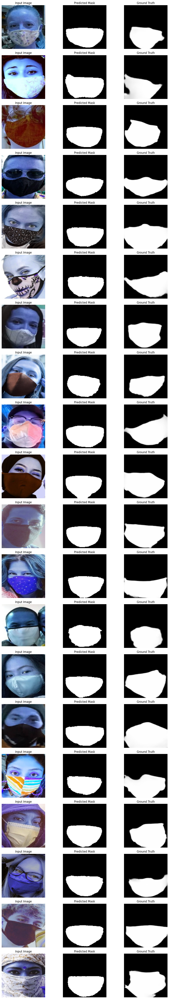

In [ ]:
num_samples = 20
sample_indices = np.random.choice(len(X_test), size=num_samples, replace=False)

fig, axes = plt.subplots(num_samples, 3, figsize=(12, num_samples * 3))

for i, idx in enumerate(sample_indices):
    sample_image = X_test[idx]
    sample_input = np.expand_dims(sample_image, axis=0)

    predicted_output = model.predict(sample_input)

    predicted_mask = (predicted_output[0, ..., 0] > 0.5).astype(np.uint8)

    ground_truth = Y_test[idx]

    # Plot the input image
    ax_input = axes[i, 0]
    ax_input.imshow(sample_image, cmap='gray')
    ax_input.set_title("Input Image")
    ax_input.axis('off')

    # Plot the predicted mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_mask, cmap='gray')
    ax_pred.set_title("Predicted Mask")
    ax_pred.axis('off')

    # Plot the ground truth mask
    ax_gt = axes[i, 2]
    ax_gt.imshow(ground_truth, cmap='gray')
    ax_gt.set_title("Ground Truth")
    ax_gt.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
# IMG_SIZE = 128 and batch-size 32, epochs were kepts less as it was trained with cpu
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=10, batch_size=BATCH_SIZE)

Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 1694s 63s/step - accuracy: 0.5431 - dice_coef: 0.3578 - iou_metric: 0.2329 - loss: 0.6170 - val_accuracy: 0.5944 - val_dice_coef: 0.2325 - val_iou_metric: 0.1322 - val_loss: 0.4934
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 1694s 62s/step - accuracy: 0.5453 - dice_coef: 0.4238 - iou_metric: 0.2874 - loss: 0.5959 - val_accuracy: 0.5787 - val_dice_coef: 0.5488 - val_iou_metric: 0.3797 - val_loss: 0.4825
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 1678s 62s/step - accuracy: 0.5446 - dice_coef: 0.7069 - iou_metric: 0.5509 - loss: 0.4237 - val_accuracy: 0.5356 - val_dice_coef: 0.7842 - val_iou_metric: 0.6453 - val_loss: 0.3446
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 1709s 63s/step - accuracy: 0.5649 - dice_coef: 0.7988 - iou_metric: 0.6655 - loss: 0.3187 - val_accuracy: 0.5509 - val_dice_coef: 0.7978 - val_iou_metric: 0.6638 - val_loss: 0.3202
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 1681s 62s/step - accuracy: 0.5717 - dice_coef: 0.8090 - iou_metric: 0.6795 - loss: 0.2

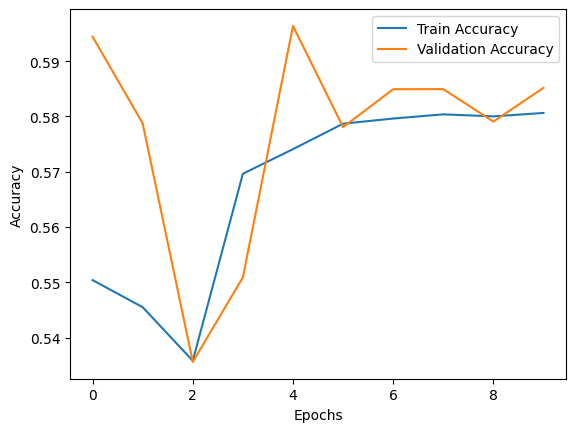

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
results = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(f"Test Accuracy: {results[1]:.4f}")
print(f"IoU Score: {results[2]:.4f}")
print(f"Dice Coefficient: {results[3]:.4f}")

7/7 ━━━━━━━━━━━━━━━━━━━━ 114s 16s/step - accuracy: 0.5811 - dice_coef: 0.7829 - iou_metric: 0.6435 - loss: 0.3226
Test Accuracy: 0.5852
IoU Score: 0.6445
Dice Coefficient: 0.7836


In [ ]:
# IMG_SIZE = 256 with Droput later = 0.1
# using GPU
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=10, batch_size=BATCH_SIZE)

Epoch 1/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 319s 7s/step - accuracy: 0.5250 - dice_coef: 0.1503 - iou_metric: 0.0955 - loss: 0.6976 - val_accuracy: 0.5597 - val_dice_coef: 0.3549 - val_iou_metric: 0.2168 - val_loss: 0.5930
Epoch 2/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 49s 2s/step - accuracy: 0.5459 - dice_coef: 0.4040 - iou_metric: 0.2567 - loss: 0.5982 - val_accuracy: 0.5414 - val_dice_coef: 0.4320 - val_iou_metric: 0.2764 - val_loss: 0.5722
Epoch 3/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5755 - dice_coef: 0.2564 - iou_metric: 0.1536 - loss: 1.0478 - val_accuracy: 0.5687 - val_dice_coef: 0.3103 - val_iou_metric: 0.1847 - val_loss: 0.6043
Epoch 4/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5481 - dice_coef: 0.3811 - iou_metric: 0.2404 - loss: 0.5998 - val_accuracy: 0.5817 - val_dice_coef: 0.2971 - val_iou_metric: 0.1756 - val_loss: 0.5788
Epoch 5/10
27/27 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5471 - dice_coef: 0.3833 - iou_metric: 0.2429 - loss: 0.5939 - val_accu

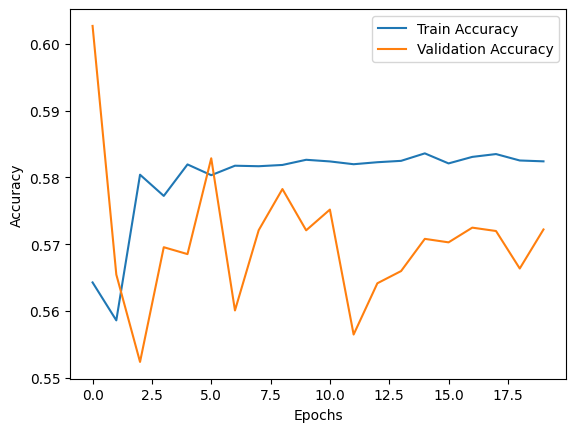

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
results = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(f"Test Accuracy: {results[1]:.4f}")
print(f"IoU Score: {results[2]:.4f}")
print(f"Dice Coefficient: {results[3]:.4f}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step - accuracy: 0.5685 - dice_coef: 0.8054 - iou_metric: 0.6747 - loss: 0.2995
Test Accuracy: 0.5722
IoU Score: 0.6711
Dice Coefficient: 0.8028


In [ ]:
# IMG_SIZE = 128 without DropOut layers
# using GPU
BATCH_SIZE = 16

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=20, batch_size=BATCH_SIZE)

Epoch 1/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 98s 1s/step - accuracy: 0.5519 - dice_coef: 0.1551 - iou_metric: 0.0983 - loss: 0.7340 - val_accuracy: 0.6027 - val_dice_coef: 0.1692 - val_iou_metric: 0.0949 - val_loss: 0.5962
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 65s 261ms/step - accuracy: 0.5577 - dice_coef: 0.5870 - iou_metric: 0.4485 - loss: 0.4328 - val_accuracy: 0.5654 - val_dice_coef: 0.7992 - val_iou_metric: 0.6660 - val_loss: 0.3461
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 257ms/step - accuracy: 0.5833 - dice_coef: 0.8147 - iou_metric: 0.6878 - loss: 0.2905 - val_accuracy: 0.5524 - val_dice_coef: 0.8046 - val_iou_metric: 0.6736 - val_loss: 0.3107
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 253ms/step - accuracy: 0.5720 - dice_coef: 0.8104 - iou_metric: 0.6819 - loss: 0.2986 - val_accuracy: 0.5695 - val_dice_coef: 0.8045 - val_iou_metric: 0.6733 - val_loss: 0.2980
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 13s 254ms/step - accuracy: 0.5810 - dice_coef: 0.8137 - iou_metric: 0.6864 - loss: 0.2838

In [ ]:
# IMG_SIZE = 128 with drop out layer and optimization
# using GPU
BATCH_SIZE = 16

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=20, batch_size=BATCH_SIZE)

Epoch 1/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 50s 562ms/step - accuracy: 0.5176 - dice_coef: 0.2247 - iou_metric: 0.1441 - loss: 0.6606 - val_accuracy: 0.5092 - val_dice_coef: 0.5032 - val_iou_metric: 0.3402 - val_loss: 0.5753
Epoch 2/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 14s 256ms/step - accuracy: 0.5388 - dice_coef: 0.5605 - iou_metric: 0.4171 - loss: 0.4839 - val_accuracy: 0.5479 - val_dice_coef: 0.7900 - val_iou_metric: 0.6534 - val_loss: 0.3202
Epoch 3/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 20s 250ms/step - accuracy: 0.5659 - dice_coef: 0.8079 - iou_metric: 0.6783 - loss: 0.3015 - val_accuracy: 0.5654 - val_dice_coef: 0.8054 - val_iou_metric: 0.6747 - val_loss: 0.2958
Epoch 4/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 21s 257ms/step - accuracy: 0.5777 - dice_coef: 0.8156 - iou_metric: 0.6893 - loss: 0.2823 - val_accuracy: 0.5705 - val_dice_coef: 0.8037 - val_iou_metric: 0.6724 - val_loss: 0.3003
Epoch 5/20
53/53 ━━━━━━━━━━━━━━━━━━━━ 14s 258ms/step - accuracy: 0.5744 - dice_coef: 0.8149 - iou_metric: 0.6880 - loss: 0.2

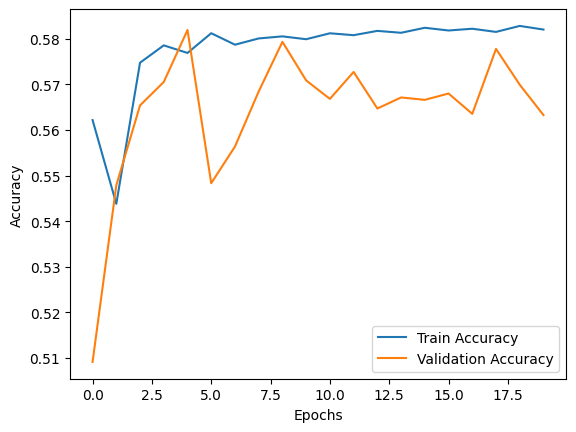

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
results = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(f"Test Accuracy: {results[1]:.4f}")
print(f"IoU Score: {results[2]:.4f}")
print(f"Dice Coefficient: {results[3]:.4f}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 76ms/step - accuracy: 0.5600 - dice_coef: 0.8133 - iou_metric: 0.6859 - loss: 0.3044
Test Accuracy: 0.5633
IoU Score: 0.6789
Dice Coefficient: 0.8084


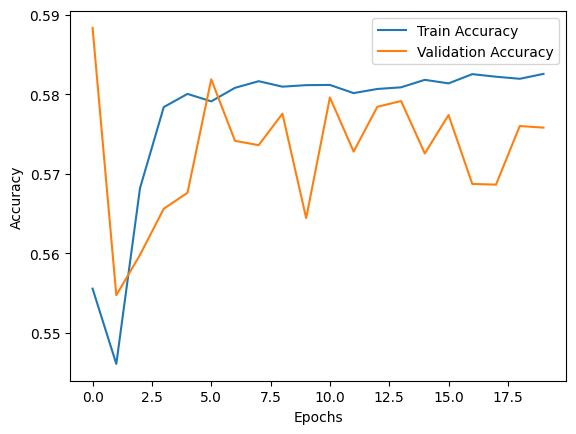

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
results = model.evaluate(X_test, Y_test, batch_size=BATCH_SIZE)
print(f"Test Accuracy: {results[1]:.4f}")
print(f"IoU Score: {results[2]:.4f}")
print(f"Dice Coefficient: {results[3]:.4f}")

14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 39ms/step - accuracy: 0.5720 - dice_coef: 0.8033 - iou_metric: 0.6717 - loss: 0.2929
Test Accuracy: 0.5758
IoU Score: 0.6677
Dice Coefficient: 0.8005


In [ ]:
# for 2100 with image-size : 128
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=25, batch_size=BATCH_SIZE)

Epoch 1/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 137s 1s/step - accuracy: 0.5198 - dice_coef: 0.2100 - iou_metric: 0.1343 - loss: 2.8518 - val_accuracy: 0.5300 - val_dice_coef: 0.7794 - val_iou_metric: 0.6388 - val_loss: 0.3624
Epoch 2/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 37s 472ms/step - accuracy: 0.5466 - dice_coef: 0.7415 - iou_metric: 0.5966 - loss: 0.3675 - val_accuracy: 0.5905 - val_dice_coef: 0.7994 - val_iou_metric: 0.6661 - val_loss: 0.2902
Epoch 3/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 25s 473ms/step - accuracy: 0.5820 - dice_coef: 0.7909 - iou_metric: 0.6547 - loss: 0.3096 - val_accuracy: 0.5878 - val_dice_coef: 0.8168 - val_iou_metric: 0.6905 - val_loss: 0.2754
Epoch 4/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 41s 474ms/step - accuracy: 0.5798 - dice_coef: 0.8037 - iou_metric: 0.6722 - loss: 0.2927 - val_accuracy: 0.5997 - val_dice_coef: 0.7909 - val_iou_metric: 0.6543 - val_loss: 0.2958
Epoch 5/25
53/53 ━━━━━━━━━━━━━━━━━━━━ 41s 474ms/step - accuracy: 0.5808 - dice_coef: 0.8059 - iou_metric: 0.6752 - loss: 0.290

In [ ]:
# improved version of U-Net : size: 128 with noisse 80
BATCH_SIZE = 32

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=30, batch_size=BATCH_SIZE)

Epoch 1/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 316s 15s/step - accuracy: 0.3872 - dice_coef: 0.4803 - iou_metric: 0.3167 - loss: 0.7762 - val_accuracy: 0.0462 - val_dice_coef: 0.4989 - val_iou_metric: 0.3326 - val_loss: 1.1274
Epoch 2/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 43s 2s/step - accuracy: 0.4774 - dice_coef: 0.5796 - iou_metric: 0.4088 - loss: 0.5956 - val_accuracy: 0.0051 - val_dice_coef: 0.4862 - val_iou_metric: 0.3215 - val_loss: 340.5185
Epoch 3/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5246 - dice_coef: 0.6699 - iou_metric: 0.5042 - loss: 0.5127 - val_accuracy: 0.1041 - val_dice_coef: 0.4998 - val_iou_metric: 0.3337 - val_loss: 303.1227
Epoch 4/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5364 - dice_coef: 0.7086 - iou_metric: 0.5491 - loss: 0.4480 - val_accuracy: 0.2898 - val_dice_coef: 0.6148 - val_iou_metric: 0.4444 - val_loss: 77.1456
Epoch 5/30
13/13 ━━━━━━━━━━━━━━━━━━━━ 41s 2s/step - accuracy: 0.5422 - dice_coef: 0.7341 - iou_metric: 0.5803 - loss: 0.4192 - va

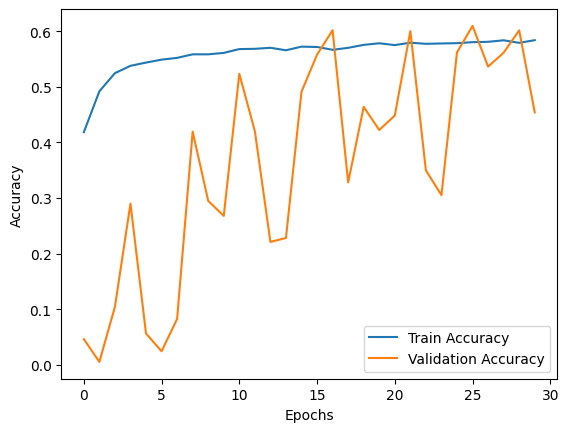

In [ ]:
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

In [ ]:
BATCH_SIZE = 8

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=30, batch_size=BATCH_SIZE)

Epoch 1/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 278s 5s/step - accuracy: 0.3928 - dice_coef: 0.4659 - iou_metric: 0.3051 - loss: 0.7558 - val_accuracy: 0.0263 - val_dice_coef: 0.4866 - val_iou_metric: 0.3232 - val_loss: 54.3668
Epoch 2/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 59s 2s/step - accuracy: 0.4829 - dice_coef: 0.5026 - iou_metric: 0.3378 - loss: 0.6168 - val_accuracy: 0.2117 - val_dice_coef: 0.4480 - val_iou_metric: 0.2897 - val_loss: 59.5278
Epoch 3/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5212 - dice_coef: 0.4722 - iou_metric: 0.3119 - loss: 0.5967 - val_accuracy: 0.0100 - val_dice_coef: 0.4809 - val_iou_metric: 0.3182 - val_loss: 9.8788
Epoch 4/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5435 - dice_coef: 0.4144 - iou_metric: 0.2639 - loss: 0.5869 - val_accuracy: 0.0068 - val_dice_coef: 0.4801 - val_iou_metric: 0.3175 - val_loss: 32.1978
Epoch 5/30
30/30 ━━━━━━━━━━━━━━━━━━━━ 82s 2s/step - accuracy: 0.5494 - dice_coef: 0.5148 - iou_metric: 0.3486 - loss: 0.5421 - val_a

In [ ]:
BATCH_SIZE = 8

model.compile(optimizer="adam", loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])


history = model.fit(X_train, Y_train,
                    validation_data=(X_test, Y_test),
                    epochs=30, batch_size=BATCH_SIZE)

Epoch 1/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 120s 879ms/step - accuracy: 0.5197 - dice_coef: 0.3776 - iou_metric: 0.2415 - loss: 0.6414 - val_accuracy: 0.3174 - val_dice_coef: 0.4762 - val_iou_metric: 0.3131 - val_loss: 0.7103
Epoch 2/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 66s 573ms/step - accuracy: 0.5607 - dice_coef: 0.6013 - iou_metric: 0.4357 - loss: 0.4838 - val_accuracy: 0.6132 - val_dice_coef: 0.0000e+00 - val_iou_metric: 0.0000e+00 - val_loss: 2.0749
Epoch 3/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 29s 588ms/step - accuracy: 0.5564 - dice_coef: 0.7277 - iou_metric: 0.5739 - loss: 0.3825 - val_accuracy: 0.6131 - val_dice_coef: 0.0355 - val_iou_metric: 0.0195 - val_loss: 0.6727
Epoch 4/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 582ms/step - accuracy: 0.5776 - dice_coef: 0.7479 - iou_metric: 0.5991 - loss: 0.3448 - val_accuracy: 0.5400 - val_dice_coef: 0.6898 - val_iou_metric: 0.5281 - val_loss: 0.4533
Epoch 5/30
50/50 ━━━━━━━━━━━━━━━━━━━━ 41s 586ms/step - accuracy: 0.5654 - dice_coef: 0.7527 - iou_metric: 0.6044 - 

In [ ]:
# running with noise threshold 120 for images to get images with it's gaussian blur, as threshold between them is 12


INITIAL_LR = 0.001
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])

early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
155/155 ━━━━━━━━━━━━━━━━━━━━ 160s 656ms/step - accuracy: 0.5492 - dice_coef: 0.6886 - iou_metric: 0.5481 - loss: 0.4173 - val_accuracy: 0.5331 - val_dice_coef: 0.8179 - val_iou_metric: 0.6923 - val_loss: 0.3573 - learning_rate: 0.0010
Epoch 2/30
155/155 ━━━━━━━━━━━━━━━━━━━━ 48s 310ms/step - accuracy: 0.5700 - dice_coef: 0.8210 - iou_metric: 0.6970 - loss: 0.2721 - val_accuracy: 0.5811 - val_dice_coef: 0.8111 - val_iou_metric: 0.6823 - val_loss: 0.3045 - learning_rate: 0.0010
Epoch 3/30
155/155 ━━━━━━━━━━━━━━━━━━━━ 46s 297ms/step - accuracy: 0.5730 - dice_coef: 0.8248 - iou_metric: 0.7023 - loss: 0.2654 - val_accuracy: 0.5570 - val_dice_coef: 0.8223 - val_iou_metric: 0.6984 - val_loss: 0.2936 - learning_rate: 0.0010
Epoch 4/30
155/155 ━━━━━━━━━━━━━━━━━━━━ 84s 310ms/step - accuracy: 0.5711 - dice_coef: 0.8259 - iou_metric: 0.7039 - loss: 0.2653 - val_accuracy: 0.5870 - val_dice_coef: 0.8278 - val_iou_metric: 0.7063 - val_loss: 0.2520 - learning_rate: 0.0010
Epoch 5/30
155/155 

In [ ]:
# running noise threshold 12
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam


INITIAL_LR = 0.001  # Initial Learning Rate

# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 102s 348ms/step - accuracy: 0.5534 - dice_coef: 0.7463 - iou_metric: 0.6153 - loss: 0.3578 - val_accuracy: 0.5478 - val_dice_coef: 0.8176 - val_iou_metric: 0.6917 - val_loss: 0.3852 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 308ms/step - accuracy: 0.5783 - dice_coef: 0.8321 - iou_metric: 0.7130 - loss: 0.2605 - val_accuracy: 0.5771 - val_dice_coef: 0.8452 - val_iou_metric: 0.7321 - val_loss: 0.2568 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 307ms/step - accuracy: 0.5803 - dice_coef: 0.8358 - iou_metric: 0.7184 - loss: 0.2528 - val_accuracy: 0.5803 - val_dice_coef: 0.8494 - val_iou_metric: 0.7384 - val_loss: 0.2369 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 308ms/step - accuracy: 0.5817 - dice_coef: 0.8370 - iou_metric: 0.7202 - loss: 0.2498 - val_accuracy: 0.5839 - val_dice_coef: 0.8537 - val_iou_metric: 0.7451 - val_loss: 0.2355 - learning_rate: 0.0010
Epoch 5/30
200/200 

In [ ]:
# using dice_coef as loss function for image-size 128
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true = tf.cast(y_true, tf.float32)
    y_pred = tf.cast(y_pred, tf.float32)

    intersection = tf.reduce_sum(y_true * y_pred)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + smooth)

def dice_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)


from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.optimizers import Adam


INITIAL_LR = 0.001
# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss=dice_loss,
              metrics=["accuracy", iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 94s 300ms/step - accuracy: 0.5050 - dice_coef: 0.7656 - iou_metric: 0.6350 - loss: 0.2344 - val_accuracy: 0.5897 - val_dice_coef: 0.8118 - val_iou_metric: 0.6838 - val_loss: 0.1882 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 57s 286ms/step - accuracy: 0.5678 - dice_coef: 0.8361 - iou_metric: 0.7191 - loss: 0.1639 - val_accuracy: 0.5692 - val_dice_coef: 0.8324 - val_iou_metric: 0.7133 - val_loss: 0.1676 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 57s 285ms/step - accuracy: 0.5675 - dice_coef: 0.8366 - iou_metric: 0.7198 - loss: 0.1634 - val_accuracy: 0.5786 - val_dice_coef: 0.8411 - val_iou_metric: 0.7260 - val_loss: 0.1589 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 58s 292ms/step - accuracy: 0.5703 - dice_coef: 0.8410 - iou_metric: 0.7262 - loss: 0.1590 - val_accuracy: 0.5192 - val_dice_coef: 0.7979 - val_iou_metric: 0.6641 - val_loss: 0.2021 - learning_rate: 0.0010
Epoch 5/30
200/200 ━

In [ ]:
# Try different learning rates

from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam


best_model_path = "best_model.keras"

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Save the best model
model_checkpoint = ModelCheckpoint(best_model_path, monitor="val_accuracy", save_best_only=True, mode="max")

best_acc = 0
best_lr = None

# Try different learning rates
for lr in [0.001, 0.0005, 0.0001]:
    print(f"\nTraining with learning rate: {lr}\n")

    model.compile(optimizer=Adam(learning_rate=lr),
                  loss="binary_crossentropy",
                  metrics=["accuracy", iou_metric, dice_coef])

    history = model.fit(train_generator,
                        validation_data=(X_test, Y_test),
                        epochs=30,
                        callbacks=[early_stopping, reduce_lr, model_checkpoint])

    # Track the best learning rate
    last_acc = max(history.history["val_accuracy"])
    if last_acc > best_acc:
        best_acc = last_acc
        best_lr = lr

print(f"Best learning rate: {best_lr}, Best validation accuracy: {best_acc}")



Training with learning rate: 0.001

Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 102s 356ms/step - accuracy: 0.5840 - dice_coef: 0.8456 - iou_metric: 0.7330 - loss: 0.2378 - val_accuracy: 0.5970 - val_dice_coef: 0.8448 - val_iou_metric: 0.7316 - val_loss: 0.2328 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 61s 303ms/step - accuracy: 0.5845 - dice_coef: 0.8462 - iou_metric: 0.7339 - loss: 0.2347 - val_accuracy: 0.5824 - val_dice_coef: 0.8622 - val_iou_metric: 0.7580 - val_loss: 0.2180 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 71s 357ms/step - accuracy: 0.5865 - dice_coef: 0.8496 - iou_metric: 0.7389 - loss: 0.2299 - val_accuracy: 0.5977 - val_dice_coef: 0.8522 - val_iou_metric: 0.7427 - val_loss: 0.2166 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 61s 307ms/step - accuracy: 0.5902 - dice_coef: 0.8521 - iou_metric: 0.7428 - loss: 0.2253 - val_accuracy: 0.5935 - val_dice_coef: 0.8569 - val_iou_metric: 0.7499 - val_loss: 0.2135 - lear

In [11]:
def binary_accuracy_threshold(y_true, y_pred, threshold=0.5):
    """ Computes accuracy after binarizing both y_pred and y_true at 0.5. """
    y_pred = tf.cast(y_pred > threshold, tf.float32)
    y_true = tf.cast(y_true > threshold, tf.float32)
    return tf.keras.metrics.binary_accuracy(y_true, y_pred)

INITIAL_LR = 0.001

# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=[binary_accuracy_threshold, iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 135s 502ms/step - binary_accuracy_threshold: 0.8829 - dice_coef: 0.8284 - iou_metric: 0.7075 - loss: 0.2713 - val_binary_accuracy_threshold: 0.8814 - val_dice_coef: 0.8375 - val_iou_metric: 0.7206 - val_loss: 0.3061 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 308ms/step - binary_accuracy_threshold: 0.8902 - dice_coef: 0.8392 - iou_metric: 0.7235 - loss: 0.2533 - val_binary_accuracy_threshold: 0.8914 - val_dice_coef: 0.8331 - val_iou_metric: 0.7141 - val_loss: 0.2536 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 308ms/step - binary_accuracy_threshold: 0.8920 - dice_coef: 0.8405 - iou_metric: 0.7253 - loss: 0.2497 - val_binary_accuracy_threshold: 0.8994 - val_dice_coef: 0.8481 - val_iou_metric: 0.7365 - val_loss: 0.2339 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 62s 309ms/step - binary_accuracy_threshold: 0.8946 - dice_coef: 0.8457 - iou_metric: 0.7332 - loss: 0.2411 - val_binary_ac

dict_keys(['binary_accuracy_threshold', 'dice_coef', 'iou_metric', 'loss', 'val_binary_accuracy_threshold', 'val_dice_coef', 'val_iou_metric', 'val_loss', 'learning_rate'])


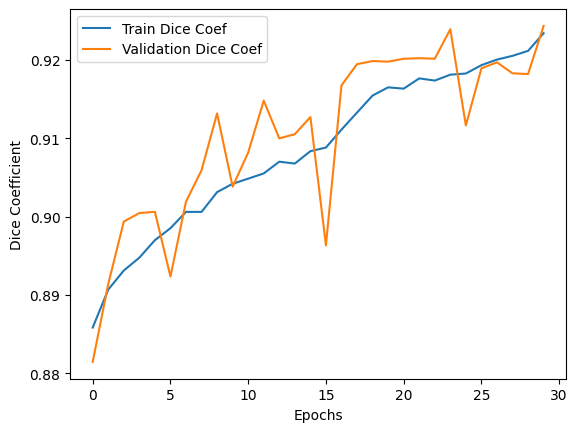

In [16]:


# Use the correct keys from history
plt.plot(history.history.get('binary_accuracy_threshold', []), label='Train Dice Coef')
plt.plot(history.history.get('val_binary_accuracy_threshold', []), label='Validation Dice Coef')
plt.xlabel("Epochs")
plt.ylabel("Dice Coefficient")
plt.legend()
plt.show()


In [ ]:
# with dropout = 0.1 for 128 sized image

INITIAL_LR = 0.001

# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 139s 379ms/step - accuracy: 0.5523 - dice_coef: 0.6909 - iou_metric: 0.5529 - loss: 0.4044 - val_accuracy: 0.5805 - val_dice_coef: 0.8138 - val_iou_metric: 0.6862 - val_loss: 0.2995 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 78s 292ms/step - accuracy: 0.5808 - dice_coef: 0.8303 - iou_metric: 0.7103 - loss: 0.2594 - val_accuracy: 0.5696 - val_dice_coef: 0.8434 - val_iou_metric: 0.7295 - val_loss: 0.2478 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 60s 299ms/step - accuracy: 0.5844 - dice_coef: 0.8359 - iou_metric: 0.7186 - loss: 0.2504 - val_accuracy: 0.5572 - val_dice_coef: 0.8375 - val_iou_metric: 0.7207 - val_loss: 0.2647 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 60s 300ms/step - accuracy: 0.5805 - dice_coef: 0.8390 - iou_metric: 0.7231 - loss: 0.2483 - val_accuracy: 0.5738 - val_dice_coef: 0.8416 - val_iou_metric: 0.7268 - val_loss: 0.2477 - learning_rate: 0.0010
Epoch 5/30
200/200 

It was found that for image of size 128*128 with batch size 8 with dropout of 0.1 the model performs well

---
Before and after dataset was updated properly
---

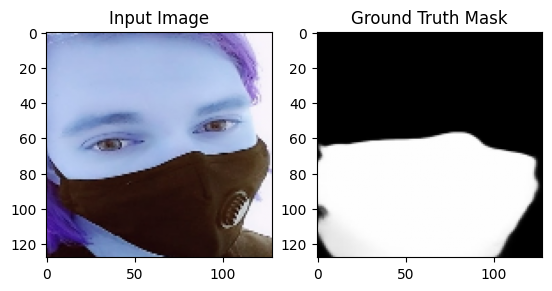

In [ ]:
# Before
# Show input image
plt.subplot(1, 2, 1)
plt.imshow(X_test[3], cmap="gray")
plt.title("Input Image")

# Show ground truth mask
plt.subplot(1, 2, 2)
plt.imshow(Y_test[3], cmap="gray")
plt.title("Ground Truth Mask")

plt.show()


001192_1.jpg


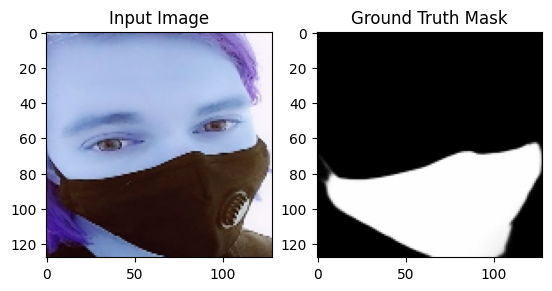

In [ ]:
# After
print(test_img_names[3])
# Show input image
plt.subplot(1, 2, 1)
plt.imshow(X_test[3], cmap="gray")
plt.title("Input Image")

# Show ground truth mask
plt.subplot(1, 2, 2)
plt.imshow(Y_test[3], cmap="gray")
plt.title("Ground Truth Mask")

plt.show()

---
Training the model with whole dataset in 3 sessions
---

In [ ]:
def residual_block(x, filters, dropout_rate=0.0):
    shortcut = x
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)
    x = layers.Conv2D(filters, 3, padding='same')(x)
    x = layers.BatchNormalization()(x)
    if dropout_rate > 0:
        x = layers.Dropout(dropout_rate)(x)

    # Match the number of filters in the shortcut to the output
    if shortcut.shape[-1] != filters:
        shortcut = layers.Conv2D(filters, 1, padding='same')(shortcut)

    x = layers.add([shortcut, x])
    x = layers.ReLU()(x)
    return x


def downsample_block(x, filters, dropout_rate=0.0):
    f = residual_block(x, filters, dropout_rate)
    p = layers.MaxPooling2D(2)(f)
    return f, p

def upsample_block(x, skip, filters, dropout_rate=0.0):
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
    x = layers.concatenate([x, skip])
    x = residual_block(x, filters, dropout_rate)
    return x

def UnetImproved(input_shape=(128, 128, 3), dropout_rate=0.0):
    inputs = layers.Input(shape=input_shape)

    # Encoder
    f1, p1 = downsample_block(inputs, 64, dropout_rate)
    f2, p2 = downsample_block(p1, 128, dropout_rate)
    f3, p3 = downsample_block(p2, 256, dropout_rate)
    f4, p4 = downsample_block(p3, 512, dropout_rate)

    # Bottleneck
    bottleneck = residual_block(p4, 1024, dropout_rate)

    # Decoder
    u6 = upsample_block(bottleneck, f4, 512, dropout_rate)
    u7 = upsample_block(u6, f3, 256, dropout_rate)
    u8 = upsample_block(u7, f2, 128, dropout_rate)
    u9 = upsample_block(u8, f1, 64, dropout_rate)

    # Output
    outputs = layers.Conv2D(1, 1, padding="same", activation="sigmoid")(u9)

    model = tf.keras.Model(inputs, outputs, name="U-Net_Improved")
    return model

# Instantiate and summarize the model
model = UnetImproved(dropout_rate=0.1)
model.summary()


Model: "U-Net_Improved"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 128, 128, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_28 (Conv2D)        │ (None, 128, 128, 64)   │          1,792 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_18    │ (None, 128, 128, 64)   │            256 │ conv2d_28[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_18 (ReLU)           │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_29 (Conv2D)        │ (None, 128, 128, 64)   │         36,928 │ re_lu_18[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_19    │ (None, 128, 128, 64)   │            256 │ conv2d_29[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_30 (Conv2D)        │ (None, 128, 128, 64)   │            256 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_9 (Dropout)       │ (None, 128, 128, 64)   │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_9 (Add)               │ (None, 128, 128, 64)   │              0 │ conv2d_30[0][0],       │
│                           │                        │                │ dropout_9[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_19 (ReLU)           │ (None, 128, 128, 64)   │              0 │ add_9[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 64, 64, 64)     │              0 │ re_lu_19[0][0]         │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_31 (Conv2D)        │ (None, 64, 64, 128)    │         73,856 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_20    │ (None, 64, 64, 128)    │            512 │ conv2d_31[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_20 (ReLU)           │ (None, 64, 64, 128)    │              0 │ batch_normalization_2… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_32 (Conv2D)        │ (None, 64, 64, 128)    │        147,584 │ re_lu_20[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_21    │ (None, 64, 64, 128)    │            512 │ conv2d_32[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├──────────────────────

 Total params: 32,451,073 (123.79 MB)

 Trainable params: 32,439,297 (123.75 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
INITIAL_LR = 0.001

# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 137s 389ms/step - accuracy: 0.5617 - dice_coef: 0.7550 - iou_metric: 0.6219 - loss: 0.3477 - val_accuracy: 0.5825 - val_dice_coef: 0.8272 - val_iou_metric: 0.7055 - val_loss: 0.2687 - learning_rate: 0.0010
Epoch 2/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 59s 297ms/step - accuracy: 0.5789 - dice_coef: 0.8300 - iou_metric: 0.7098 - loss: 0.2612 - val_accuracy: 0.5952 - val_dice_coef: 0.8114 - val_iou_metric: 0.6829 - val_loss: 0.2743 - learning_rate: 0.0010
Epoch 3/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 59s 297ms/step - accuracy: 0.5788 - dice_coef: 0.8359 - iou_metric: 0.7186 - loss: 0.2538 - val_accuracy: 0.5939 - val_dice_coef: 0.8378 - val_iou_metric: 0.7210 - val_loss: 0.2396 - learning_rate: 0.0010
Epoch 4/30
200/200 ━━━━━━━━━━━━━━━━━━━━ 61s 304ms/step - accuracy: 0.5817 - dice_coef: 0.8387 - iou_metric: 0.7227 - loss: 0.2485 - val_accuracy: 0.5967 - val_dice_coef: 0.8396 - val_iou_metric: 0.7238 - val_loss: 0.2335 - learning_rate: 0.0010
Epoch 5/30
200/200 

In [ ]:
model.save("model1.h5")

In [ ]:
# Part 2:


# Paths to folders
IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"

IMG_SIZE = 128
TOTAL_SAMPLES = 9383

# Function to load and filter data based on noise
def load_and_filter_data(image_folder, mask_folder, total_samples, noise_threshold=0.1):
    all_image_files = sorted(os.listdir(image_folder))
    all_mask_files = sorted(os.listdir(mask_folder))

    selected_images, selected_masks = [], []

    for img_name, mask_name in zip(all_image_files, all_mask_files):
        img_path = os.path.join(image_folder, img_name)
        mask_path = os.path.join(mask_folder, mask_name)

        img = cv2.imread(img_path)

        selected_images.append(img_name)
        selected_masks.append(mask_name)

        if len(selected_images) >= total_samples:
            break

    return selected_images, selected_masks

# Load and filter images
selected_image_files, selected_mask_files = load_and_filter_data(
    IMAGE_FOLDER, MASK_FOLDER, TOTAL_SAMPLES
)
selected_image_files = selected_image_files[4000:7000]
selected_mask_files = selected_mask_files[4000:7000]

# Function to load selected data
def load_selected_data(image_files, mask_files, image_folder, mask_folder):
    images, masks = [], []

    for img_name, mask_name in zip(image_files, mask_files):
        img = cv2.imread(os.path.join(image_folder, img_name))
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0  # Normalize

        mask = cv2.imread(os.path.join(mask_folder, mask_name), cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        mask = np.expand_dims(mask, axis=-1) / 255.0  # Normalize and add channel

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load only selected images
X, Y = load_selected_data(selected_image_files, selected_mask_files, IMAGE_FOLDER, MASK_FOLDER)
def data_augment(X_train, Y_train):
    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True
    )
    return datagen.flow(X_train, Y_train, batch_size=16)

# Train-test split
X_train, X_test, Y_train, Y_test, train_img_names, test_img_names = train_test_split(
    X, Y, selected_image_files, test_size=0.2, random_state=42
)
train_generator = data_augment(X_train, Y_train)

In [ ]:
model = tf.keras.models.load_model("model1.h5")

In [ ]:

# Train the model with callbacks
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])

Epoch 1/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 64s 427ms/step - accuracy: 0.5885 - dice_coef: 0.8733 - iou_metric: 0.7755 - loss: 0.1979 - val_accuracy: 0.5904 - val_dice_coef: 0.8826 - val_iou_metric: 0.7900 - val_loss: 0.1854 - learning_rate: 5.0000e-04
Epoch 2/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 44s 296ms/step - accuracy: 0.5921 - dice_coef: 0.8763 - iou_metric: 0.7803 - loss: 0.1908 - val_accuracy: 0.5992 - val_dice_coef: 0.8777 - val_iou_metric: 0.7822 - val_loss: 0.1869 - learning_rate: 5.0000e-04
Epoch 3/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 47s 310ms/step - accuracy: 0.5894 - dice_coef: 0.8755 - iou_metric: 0.7789 - loss: 0.1930 - val_accuracy: 0.5984 - val_dice_coef: 0.8836 - val_iou_metric: 0.7917 - val_loss: 0.1788 - learning_rate: 5.0000e-04
Epoch 4/30
150/150 ━━━━━━━━━━━━━━━━━━━━ 47s 310ms/step - accuracy: 0.5903 - dice_coef: 0.8791 - iou_metric: 0.7846 - loss: 0.1890 - val_accuracy: 0.5978 - val_dice_coef: 0.8861 - val_iou_metric: 0.7957 - val_loss: 0.1758 - learning_rate: 5.0000e-04
Epoc

In [ ]:
model.save("model2.h5")

In [ ]:
# Part 3:

# Paths to folders
IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"

IMG_SIZE = 128
TOTAL_SAMPLES = 9383

# Function to load and filter data based on noise
def load_and_filter_data(image_folder, mask_folder, total_samples, noise_threshold=12):
    all_image_files = sorted(os.listdir(image_folder))
    all_mask_files = sorted(os.listdir(mask_folder))

    selected_images, selected_masks = [], []

    for img_name, mask_name in zip(all_image_files, all_mask_files):
        img_path = os.path.join(image_folder, img_name)
        mask_path = os.path.join(mask_folder, mask_name)

        img = cv2.imread(img_path)
        selected_images.append(img_name)
        selected_masks.append(mask_name)

        if len(selected_images) >= total_samples:
            break

    return selected_images, selected_masks

# Load and filter images
selected_image_files, selected_mask_files = load_and_filter_data(
    IMAGE_FOLDER, MASK_FOLDER, TOTAL_SAMPLES
)
selected_image_files = selected_image_files[7000:]
selected_mask_files = selected_mask_files[7000:]

# Function to load selected data
def load_selected_data(image_files, mask_files, image_folder, mask_folder):
    images, masks = [], []

    for img_name, mask_name in zip(image_files, mask_files):
        img = cv2.imread(os.path.join(image_folder, img_name))
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0  # Normalize

        mask = cv2.imread(os.path.join(mask_folder, mask_name), cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        mask = np.expand_dims(mask, axis=-1) / 255.0  # Normalize and add channel

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load only selected images
X, Y = load_selected_data(selected_image_files, selected_mask_files, IMAGE_FOLDER, MASK_FOLDER)
def data_augment(X_train, Y_train):
    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True
    )
    return datagen.flow(X_train, Y_train, batch_size=16)

# Train-test split
X_train, X_test, Y_train, Y_test, train_img_names, test_img_names = train_test_split(
    X, Y, selected_image_files, test_size=0.2, random_state=42
)
train_generator = data_augment(X_train, Y_train)

In [ ]:
model = tf.keras.models.load_model("model2.h5")

In [ ]:
INITIAL_LR = 0.001  # Initial Learning Rate

# Compile model with Adam optimizer and initial learning rate
model.compile(optimizer=Adam(learning_rate=INITIAL_LR),
              loss="binary_crossentropy",
              metrics=["accuracy", iou_metric, dice_coef])

# Define callbacks
early_stopping = EarlyStopping(monitor="val_loss", patience=10, restore_best_weights=True)

reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=5, min_lr=1e-6)
history = model.fit(train_generator,
                    validation_data=(X_test, Y_test),
                    epochs=30,
                    callbacks=[early_stopping, reduce_lr])
model.save("model3.h5")

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 169s 878ms/step - accuracy: 0.6101 - dice_coef: 0.8413 - iou_metric: 0.7267 - loss: 0.2040 - val_accuracy: 0.6142 - val_dice_coef: 0.8467 - val_iou_metric: 0.7345 - val_loss: 0.1880 - learning_rate: 0.0010
Epoch 2/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 39s 324ms/step - accuracy: 0.6181 - dice_coef: 0.8496 - iou_metric: 0.7392 - loss: 0.1875 - val_accuracy: 0.6087 - val_dice_coef: 0.8620 - val_iou_metric: 0.7578 - val_loss: 0.1799 - learning_rate: 0.0010
Epoch 3/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 39s 326ms/step - accuracy: 0.6129 - dice_coef: 0.8577 - iou_metric: 0.7515 - loss: 0.1832 - val_accuracy: 0.6168 - val_dice_coef: 0.8613 - val_iou_metric: 0.7566 - val_loss: 0.1692 - learning_rate: 0.0010
Epoch 4/30
120/120 ━━━━━━━━━━━━━━━━━━━━ 36s 303ms/step - accuracy: 0.6152 - dice_coef: 0.8541 - iou_metric: 0.7460 - loss: 0.1844 - val_accuracy: 0.6031 - val_dice_coef: 0.8534 - val_iou_metric: 0.7447 - val_loss: 0.1970 - learning_rate: 0.0010
Epoch 5/30
120/120 

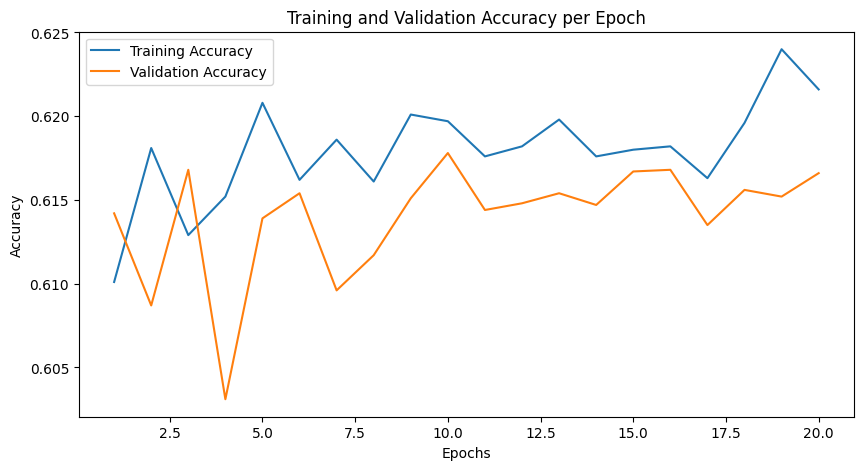

In [25]:
plt.plot(history.history.get('accuracy', []), label='Training Accuracy')
plt.plot(history.history.get('val_accuracy', []), label='Validation Accuracy')
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.show()


---
Final-model & result visualization with traditional segmentaion approach
---


In [17]:
import tensorflow as tf
model = tf.keras.models.load_model("model3.h5")

In [ ]:
# Part 3:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
# Paths to folders
IMAGE_FOLDER = "/content/dataset/MSFD/1/face_crop/"
MASK_FOLDER = "/content/dataset/MSFD/1/face_crop_segmentation/"

IMG_SIZE = 128
TOTAL_SAMPLES = 9383


# Function to load and filter data based on noise
def load_and_filter_data(image_folder, mask_folder, total_samples, noise_threshold=12):
    all_image_files = sorted(os.listdir(image_folder))
    all_mask_files = sorted(os.listdir(mask_folder))

    selected_images, selected_masks = [], []

    for img_name, mask_name in zip(all_image_files, all_mask_files):
        img_path = os.path.join(image_folder, img_name)
        mask_path = os.path.join(mask_folder, mask_name)

        img = cv2.imread(img_path)
        selected_images.append(img_name)
        selected_masks.append(mask_name)

        if len(selected_images) >= total_samples:
            break

    return selected_images, selected_masks

# Load and filter images
selected_image_files, selected_mask_files = load_and_filter_data(
    IMAGE_FOLDER, MASK_FOLDER, TOTAL_SAMPLES,
)
selected_image_files = selected_image_files[7000:]
selected_mask_files = selected_mask_files[7000:]

# Function to load selected data
def load_selected_data(image_files, mask_files, image_folder, mask_folder):
    images, masks = [], []

    for img_name, mask_name in zip(image_files, mask_files):
        img = cv2.imread(os.path.join(image_folder, img_name))
        img = cv2.resize(img, (IMG_SIZE, IMG_SIZE))
        img = img / 255.0  # Normalize

        mask = cv2.imread(os.path.join(mask_folder, mask_name), cv2.IMREAD_GRAYSCALE)
        mask = cv2.resize(mask, (IMG_SIZE, IMG_SIZE))
        mask = np.expand_dims(mask, axis=-1) / 255.0  # Normalize and add channel

        images.append(img)
        masks.append(mask)

    return np.array(images), np.array(masks)

# Load only selected images
X, Y = load_selected_data(selected_image_files, selected_mask_files, IMAGE_FOLDER, MASK_FOLDER)
def data_augment(X_train, Y_train):
    datagen = ImageDataGenerator(
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        zoom_range=0.1,
        horizontal_flip=True
    )
    return datagen.flow(X_train, Y_train, batch_size=16)

# Train-test split
X_train, X_test, Y_train, Y_test, train_img_names, test_img_names = train_test_split(
    X, Y, selected_image_files, test_size=0.2, random_state=42
)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
Predicted Mask Shape: (1, 128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Predicted Mask Shape: (1, 128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
Predicted Mask Shape: (1, 128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
Predicted Mask Shape: (1, 128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
Predicted Mask Shape: (1, 128, 128, 1)
Predicted Mask Shape: (128, 128) Ground Truth Shape: (128, 128, 1)
Predicted Mask Shape: (1

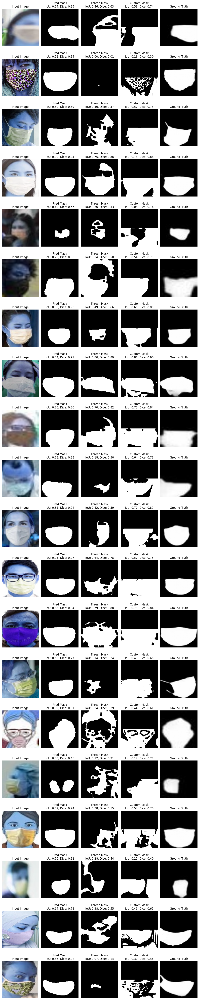

In [ ]:
num_samples = 20
np.random.seed(67)

# Randomly choose 20 indices from X_test to visualize the result
sample_indices = np.random.choice(len(X_test), size=num_samples, replace=False)

# function for region growing approach using seed point to be lower middle part of the image
def region_growing(image, seed_point):
    # Convert image to uint8
    image = (image * 255).astype(np.uint8) if image.max() <= 1 else image.astype(np.uint8)

    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = img_gray.shape
    mask = np.zeros_like(img_gray, dtype=np.uint8)

    # Seed Point (x, y)
    x, y = seed_point
    seed_value = img_gray[y, x]

    threshold = 21
    stack = [(x, y)]

    while stack:
        px, py = stack.pop()
        if mask[py, px] == 0 and abs(int(img_gray[py, px]) - int(seed_value)) < threshold:
            mask[py, px] = 255
            #  checking neighbours
            if px > 0: stack.append((px-1, py))
            if px < w-1: stack.append((px+1, py))
            if py > 0: stack.append((px, py-1))
            if py < h-1: stack.append((px, py+1))

    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

# custom segmentation approach where inverge binary thresholding and binary thresholding is combined with converting upper part of image to black
def segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, inv_binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    height, width = binary_thresh.shape
    binary_thresh[:height//2, :] = 0
    inv_binary_thresh[:height//2, :] = 0

    if np.count_nonzero(binary_thresh) > np.count_nonzero(inv_binary_thresh):
        return binary_thresh
    else:
        return inv_binary_thresh


# to plot the images
fig, axes = plt.subplots(num_samples, 5, figsize=(12, num_samples * 3))

for i, idx in enumerate(sample_indices):

    sample_image = X_test[idx]

    # Prepare the image (add a batch dimension)
    sample_input = np.expand_dims(sample_image, axis=0)

    # Predict using the model
    predicted_output = model.predict(sample_input)
    predicted_mask = (predicted_output[0, ..., 0] > 0.5).astype(np.uint8)
    predicted_mask = np.squeeze(predicted_mask)

    # Region Growing Segmentation
    seed_x = sample_image.shape[1] // 2
    seed_y = int(sample_image.shape[0] * 0.70)
    region_grow_seg = region_growing(sample_image, (seed_x, seed_y))
    sample_image = (sample_image * 255).astype(np.uint8) if sample_image.max() <= 1 else sample_image.astype(np.uint8)

    if sample_image.shape[-1] == 1:  # Convert from (H, W, 1) to (H, W)
        sample_image = np.squeeze(sample_image, axis=-1)

    custom_seg = segmentation(sample_image)
    # Ground truth mask
    ground_truth = Y_test[idx]
    ground_truth = np.squeeze(ground_truth)

    # Calculate IoU and Dice Scores
    # for ground truth
    iou_pred_gt = iou_metric(ground_truth, predicted_mask)
    dice_pred_gt = dice_coef(ground_truth, predicted_mask)

    # for binary thresholding
    iou_pred_thresh = iou_metric(ground_truth, region_grow_seg)
    dice_pred_thresh = dice_coef(ground_truth, region_grow_seg)

    # for region growing
    iou_pred_cust = iou_metric(ground_truth, custom_seg)
    dice_pred_cust = dice_coef(ground_truth, custom_seg)

    # Plot input image
    ax_input = axes[i, 0]
    ax_input.imshow(sample_image, cmap='gray')
    ax_input.set_title("Input Image")
    ax_input.axis('off')

    # Plot predicted mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_mask, cmap='gray')
    ax_pred.set_title(f"Pred Mask\nIoU: {iou_pred_gt:.2f}, Dice: {dice_pred_gt:.2f}")
    ax_pred.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 2]
    ax_thresh.imshow(region_grow_seg, cmap='gray')
    ax_thresh.set_title(f"Thresh Mask\nIoU: {iou_pred_thresh:.2f}, Dice: {dice_pred_thresh:.2f}")
    ax_thresh.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 3]
    ax_thresh.imshow(custom_seg, cmap='gray')
    ax_thresh.set_title(f"Custom Mask\nIoU: {iou_pred_cust:.2f}, Dice: {dice_pred_cust:.2f}")
    ax_thresh.axis('off')
    # Plot ground truth mask
    ax_gt = axes[i, 4]
    ax_gt.imshow(ground_truth, cmap='gray')
    ax_gt.set_title("Ground Truth")
    ax_gt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step


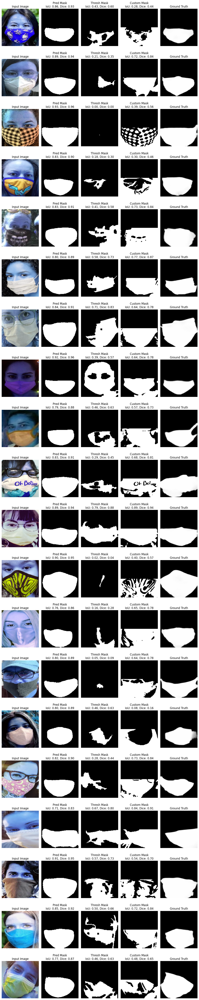

In [19]:
# with different dice_coeff and iou_metric: converting all values to 0 or 1
num_samples = 20
np.random.seed(67)

# Randomly choose 20 indices from X_test to visualize the result
sample_indices = np.random.choice(len(X_test), size=num_samples, replace=False)

# function for region growing approach using seed point to be lower middle part of the image
def region_growing(image, seed_point):
    # Convert image to uint8
    image = (image * 255).astype(np.uint8) if image.max() <= 1 else image.astype(np.uint8)

    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = img_gray.shape
    mask = np.zeros_like(img_gray, dtype=np.uint8)

    # Seed Point (x, y)
    x, y = seed_point
    seed_value = img_gray[y, x]

    threshold = 21
    stack = [(x, y)]

    while stack:
        px, py = stack.pop()
        if mask[py, px] == 0 and abs(int(img_gray[py, px]) - int(seed_value)) < threshold:
            mask[py, px] = 255
            #  checking neighbours
            if px > 0: stack.append((px-1, py))
            if px < w-1: stack.append((px+1, py))
            if py > 0: stack.append((px, py-1))
            if py < h-1: stack.append((px, py+1))

    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

# custom segmentation approach where inverge binary thresholding and binary thresholding is combined with converting upper part of image to black
def segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, inv_binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    height, width = binary_thresh.shape
    binary_thresh[:height//2, :] = 0
    inv_binary_thresh[:height//2, :] = 0

    if np.count_nonzero(binary_thresh) > np.count_nonzero(inv_binary_thresh):
        return binary_thresh
    else:
        return inv_binary_thresh


# to plot the images
fig, axes = plt.subplots(num_samples, 5, figsize=(12, num_samples * 3))

for i, idx in enumerate(sample_indices):

    sample_image = X_test[idx]

    # Prepare the image (add a batch dimension)
    sample_input = np.expand_dims(sample_image, axis=0)

    # Predict using the model
    predicted_output = model.predict(sample_input)
    predicted_mask = (predicted_output[0, ..., 0] > 0.5).astype(np.uint8)
    predicted_mask = np.squeeze(predicted_mask)

    # Region Growing Segmentation
    seed_x = sample_image.shape[1] // 2
    seed_y = int(sample_image.shape[0] * 0.70)
    region_grow_seg = region_growing(sample_image, (seed_x, seed_y))
    sample_image = (sample_image * 255).astype(np.uint8) if sample_image.max() <= 1 else sample_image.astype(np.uint8)

    if sample_image.shape[-1] == 1:  # Convert from (H, W, 1) to (H, W)
        sample_image = np.squeeze(sample_image, axis=-1)

    custom_seg = segmentation(sample_image)
    # Ground truth mask
    ground_truth = Y_test[idx]
    ground_truth = np.squeeze(ground_truth)

    # Calculate IoU and Dice Scores
    # for ground truth
    iou_pred_gt = iou_metric(ground_truth, predicted_mask)
    dice_pred_gt = dice_coef(ground_truth, predicted_mask)

    # for binary thresholding
    iou_pred_thresh = iou_metric(ground_truth, region_grow_seg)
    dice_pred_thresh = dice_coef(ground_truth, region_grow_seg)

    # for region growing
    iou_pred_cust = iou_metric(ground_truth, custom_seg)
    dice_pred_cust = dice_coef(ground_truth, custom_seg)

    # Plot input image
    ax_input = axes[i, 0]
    ax_input.imshow(sample_image, cmap='gray')
    ax_input.set_title("Input Image")
    ax_input.axis('off')

    # Plot predicted mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_mask, cmap='gray')
    ax_pred.set_title(f"Pred Mask\nIoU: {iou_pred_gt:.2f}, Dice: {dice_pred_gt:.2f}")
    ax_pred.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 2]
    ax_thresh.imshow(region_grow_seg, cmap='gray')
    ax_thresh.set_title(f"Thresh Mask\nIoU: {iou_pred_thresh:.2f}, Dice: {dice_pred_thresh:.2f}")
    ax_thresh.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 3]
    ax_thresh.imshow(custom_seg, cmap='gray')
    ax_thresh.set_title(f"Custom Mask\nIoU: {iou_pred_cust:.2f}, Dice: {dice_pred_cust:.2f}")
    ax_thresh.axis('off')
    # Plot ground truth mask
    ax_gt = axes[i, 4]
    ax_gt.imshow(ground_truth, cmap='gray')
    ax_gt.set_title("Ground Truth")
    ax_gt.axis('off')

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


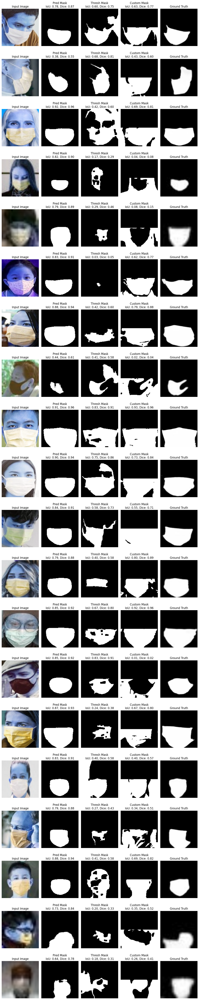

In [ ]:
# Number of samples to visualize
num_samples = 20
np.random.seed(67)

# Randomly choose 20 indices from X_test to visualize the result
sample_indices = np.random.choice(len(X_test), size=num_samples, replace=False)

# function for region growing approach using seed point to be lower middle part of the image
def region_growing(image, seed_point):
    # Convert image to uint8
    image = (image * 255).astype(np.uint8) if image.max() <= 1 else image.astype(np.uint8)

    img_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    h, w = img_gray.shape
    mask = np.zeros_like(img_gray, dtype=np.uint8)

    # Seed Point (x, y)
    x, y = seed_point
    seed_value = img_gray[y, x]

    threshold = 21
    stack = [(x, y)]

    while stack:
        px, py = stack.pop()
        if mask[py, px] == 0 and abs(int(img_gray[py, px]) - int(seed_value)) < threshold:
            mask[py, px] = 255
            #  checking neighbours
            if px > 0: stack.append((px-1, py))
            if px < w-1: stack.append((px+1, py))
            if py > 0: stack.append((px, py-1))
            if py < h-1: stack.append((px, py+1))

    kernel = np.ones((5,5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    return mask

# custom segmentation approach where inverge binary thresholding and binary thresholding is combined with converting upper part of image to black
def segmentation(image):
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    gray_blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    _, binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    _, inv_binary_thresh = cv2.threshold(gray_blurred, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    height, width = binary_thresh.shape
    binary_thresh[:height//2, :] = 0
    inv_binary_thresh[:height//2, :] = 0

    if np.count_nonzero(binary_thresh) > np.count_nonzero(inv_binary_thresh):
        return binary_thresh
    else:
        return inv_binary_thresh


# to plot the images
fig, axes = plt.subplots(num_samples, 5, figsize=(12, num_samples * 3))

for i, idx in enumerate(sample_indices):

    sample_image = X_test[idx]

    # Prepare the image (add a batch dimension)
    sample_input = np.expand_dims(sample_image, axis=0)

    # Predict using the model
    predicted_output = model.predict(sample_input)
    print("Predicted Mask Shape:", predicted_output.shape)
    predicted_mask = (predicted_output[0, ..., 0] > 0.5).astype(np.uint8)
    predicted_mask = np.squeeze(predicted_mask)

    # Region Growing Segmentation
    seed_x = sample_image.shape[1] // 2
    seed_y = int(sample_image.shape[0] * 0.70)
    region_grow_seg = region_growing(sample_image, (seed_x, seed_y))
    sample_image = (sample_image * 255).astype(np.uint8) if sample_image.max() <= 1 else sample_image.astype(np.uint8)

    if sample_image.shape[-1] == 1:  # Convert from (H, W, 1) to (H, W)
        sample_image = np.squeeze(sample_image, axis=-1)

    custom_seg = segmentation(sample_image)
    # Ground truth mask
    ground_truth = Y_test[idx]
    print("Predicted Mask Shape:", predicted_mask.shape, "Ground Truth Shape:", ground_truth.shape)
    ground_truth = np.squeeze(ground_truth)
    print("Predicted Mask Shape:", predicted_mask.shape, "Ground Truth Shape:", ground_truth.shape)

    # Calculate IoU and Dice Scores
    # for ground truth
    iou_pred_gt = iou_metric(ground_truth, predicted_mask)
    dice_pred_gt = dice_coef(ground_truth, predicted_mask)

    # for binary thresholding
    iou_pred_thresh = iou_metric(ground_truth, region_grow_seg)
    dice_pred_thresh = dice_coef(ground_truth, region_grow_seg)

    # for region growing
    iou_pred_cust = iou_metric(ground_truth, custom_seg)
    dice_pred_cust = dice_coef(ground_truth, custom_seg)

    # Plot input image
    ax_input = axes[i, 0]
    ax_input.imshow(sample_image, cmap='gray')
    ax_input.set_title("Input Image")
    ax_input.axis('off')

    # Plot predicted mask
    ax_pred = axes[i, 1]
    ax_pred.imshow(predicted_mask, cmap='gray')
    ax_pred.set_title(f"Pred Mask\nIoU: {iou_pred_gt:.2f}, Dice: {dice_pred_gt:.2f}")
    ax_pred.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 2]
    ax_thresh.imshow(region_grow_seg, cmap='gray')
    ax_thresh.set_title(f"Thresh Mask\nIoU: {iou_pred_thresh:.2f}, Dice: {dice_pred_thresh:.2f}")
    ax_thresh.axis('off')

    # Plot thresholding mask
    ax_thresh = axes[i, 3]
    ax_thresh.imshow(custom_seg, cmap='gray')
    ax_thresh.set_title(f"Custom Mask\nIoU: {iou_pred_cust:.2f}, Dice: {dice_pred_cust:.2f}")
    ax_thresh.axis('off')
    # Plot ground truth mask
    ax_gt = axes[i, 4]
    ax_gt.imshow(ground_truth, cmap='gray')
    ax_gt.set_title("Ground Truth")
    ax_gt.axis('off')

plt.tight_layout()
plt.show()